In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as T
from imageio import imread
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
import cv2

In [2]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [3]:
vgg = torchvision.models.vgg19(pretrained=True)
for layer in vgg.parameters():
    layer.requires_grad = False

vgg.eval()
vgg.to(device)

c:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [4]:
img_style   = imread('StarryNight.jpg') 
img_content = imread('IMG_1101.jpg') # or any image!
img_target = np.random.randint(low=0,high=255,size=img_content.shape,dtype=np.uint8)

img_style.shape, img_content.shape, img_target.shape

C:\Users\Derrick\AppData\Local\Temp\ipykernel_22520\4098491900.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_style   = imread('StarryNight.jpg')
C:\Users\Derrick\AppData\Local\Temp\ipykernel_22520\4098491900.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img_content = imread('IMG_1101.jpg') # or any image!


((1070, 1650, 3), (3024, 4032, 3), (3024, 4032, 3))

In [5]:
Ts = T.Compose([ T.ToTensor(),
                 T.Resize(512),
                 T.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
               ])

# apply them to the images ("unsqueeze" to make them a 4D tensor) and push to GPU
img_style = Ts(img_style).unsqueeze(0).to(device)
img_content = Ts(img_content).unsqueeze(0).to(device)
img_target = Ts(img_target).unsqueeze(0).to(device)

img_style.shape, img_content.shape, img_target.shape

(torch.Size([1, 3, 512, 789]),
 torch.Size([1, 3, 512, 682]),
 torch.Size([1, 3, 512, 682]))

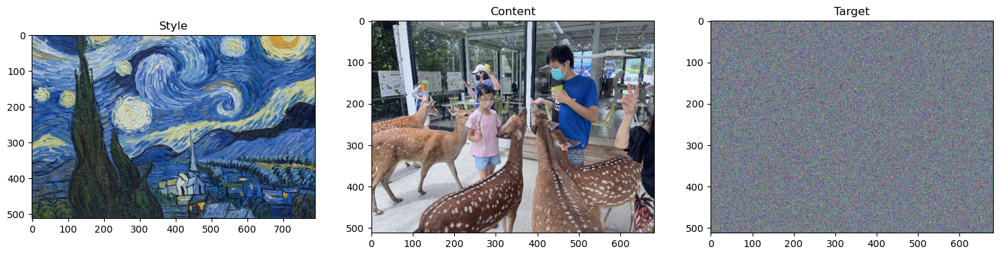

In [6]:
# Let's have a look at the "before" pics
fig,ax = plt.subplots(1,3,figsize=(18,6))

pic = img_style.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[0].imshow(pic)
ax[0].set_title('Style')

pic = img_content.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[1].imshow(pic)
ax[1].set_title('Content')

pic = img_target.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[2].imshow(pic)
ax[2].set_title('Target')

plt.show()

In [7]:
def get_feature(img, model):
    feature_maps = []
    feature_names = []
    count = 0

    for i in range(len(model.features)):
        img = model.features[i](img)
        if "Conv2d" in str(model.features[i]):
            feature_maps.append(img)
            feature_names.append(f'Conv_{str(count).zfill(2)}')
            count += 1
    
    return feature_maps, feature_names

def gram(matrix):
    _, chans, height, width = matrix.shape
    matrix = matrix.reshape(chans, height * width)
    gram = torch.mm(matrix, matrix.t()) / (chans * height * width)
    return gram

In [8]:
content_feature_maps, content_feature_names = get_feature(img_content, vgg)

for i in range(len(content_feature_maps)):
    print(f"Feature map {content_feature_names[i]} has a size {content_feature_maps[i].shape}")

Feature map Conv_00 has a size torch.Size([1, 64, 512, 682])
Feature map Conv_01 has a size torch.Size([1, 64, 512, 682])
Feature map Conv_02 has a size torch.Size([1, 128, 256, 341])
Feature map Conv_03 has a size torch.Size([1, 128, 256, 341])
Feature map Conv_04 has a size torch.Size([1, 256, 128, 170])
Feature map Conv_05 has a size torch.Size([1, 256, 128, 170])
Feature map Conv_06 has a size torch.Size([1, 256, 128, 170])
Feature map Conv_07 has a size torch.Size([1, 256, 128, 170])
Feature map Conv_08 has a size torch.Size([1, 512, 64, 85])
Feature map Conv_09 has a size torch.Size([1, 512, 64, 85])
Feature map Conv_10 has a size torch.Size([1, 512, 64, 85])
Feature map Conv_11 has a size torch.Size([1, 512, 64, 85])
Feature map Conv_12 has a size torch.Size([1, 512, 32, 42])
Feature map Conv_13 has a size torch.Size([1, 512, 32, 42])
Feature map Conv_14 has a size torch.Size([1, 512, 32, 42])
Feature map Conv_15 has a size torch.Size([1, 512, 32, 42])


In [9]:
def display_feature_maps(feature_maps, feature_names, num_panels=6):
  fig,axs = plt.subplots(2, num_panels,figsize=(18,6))
  for i in range(num_panels):
    pic = np.mean(feature_maps[i].cpu().squeeze().numpy() ,axis=0)
    pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))

    axs[0,i].imshow(pic)
    axs[0,i].set_title(f'Content: {feature_names[i]}')

    pic = gram(feature_maps[i]).cpu().numpy()
    pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))

    axs[1,i].imshow(pic,vmax=.1)
    axs[1,i].set_title(f'Gram: {feature_names[i]}')

  plt.tight_layout()
  plt.show()

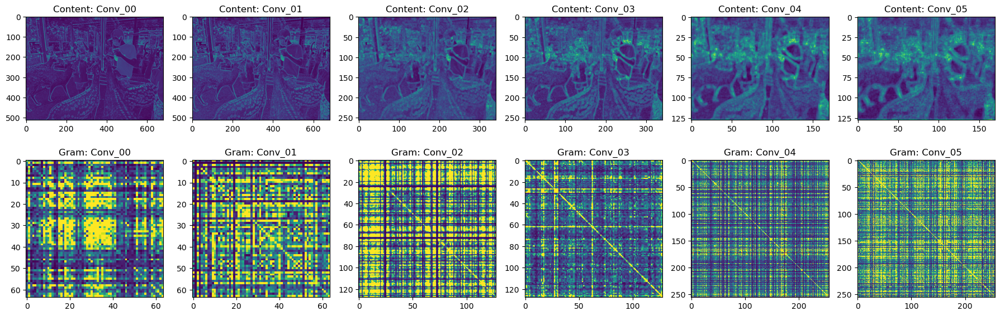

In [10]:
content_feature_maps, content_feature_names = get_feature(img_content, vgg)
display_feature_maps(content_feature_maps, content_feature_names)

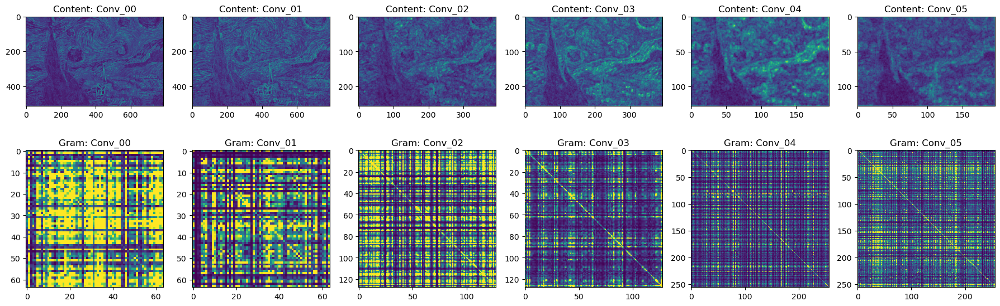

In [11]:
style_feature_maps, style_feature_names = get_feature(img_style, vgg)
display_feature_maps(style_feature_maps, style_feature_names)

In [12]:
layers_content = [f"Conv_{str(i).zfill(2)}" for i in range(3)]
layers_style = [f"Conv_{str(i).zfill(2)}" for i in range(4)]
weights_style = [1,.5,.5,.3]

layers_content

['Conv_00', 'Conv_01', 'Conv_02']

In [13]:
def display_results():
    fig,ax = plt.subplots(1,3,figsize=(18,11))

    pic = img_style.cpu().squeeze().numpy().transpose((1,2,0))
    pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
    ax[0].imshow(pic,aspect=.6)
    ax[0].set_title('Style picture',fontweight='bold')

    pic = img_content.cpu().squeeze().numpy().transpose((1,2,0))
    pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
    ax[1].imshow(pic)
    ax[1].set_title('Content picture',fontweight='bold')

    pic = torch.sigmoid(target).cpu().detach().squeeze().numpy().transpose((1,2,0))
    ax[2].imshow(pic)
    ax[2].set_title('Target picture',fontweight='bold')

    plt.show()

Iteration 0500 is completed. style_loss: 0.00 | content_loss: 13.49 | total_loss: 53.76


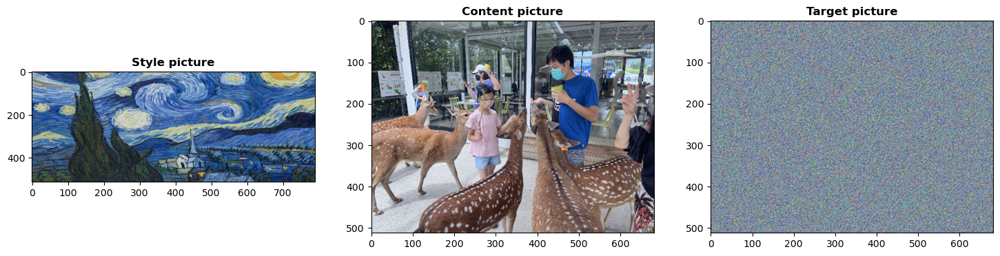

Iteration 1000 is completed. style_loss: 0.00 | content_loss: 13.09 | total_loss: 22.88


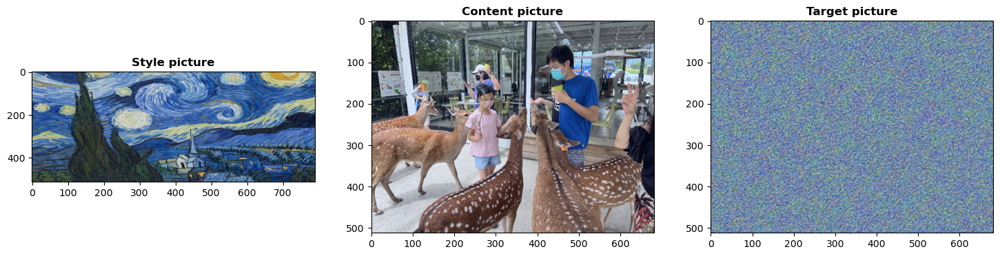

Iteration 1500 is completed. style_loss: 0.00 | content_loss: 10.78 | total_loss: 13.80


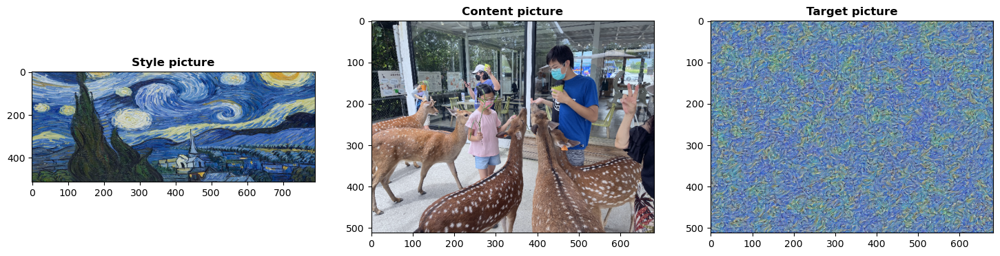

Iteration 2000 is completed. style_loss: 0.00 | content_loss: 7.62 | total_loss: 9.03


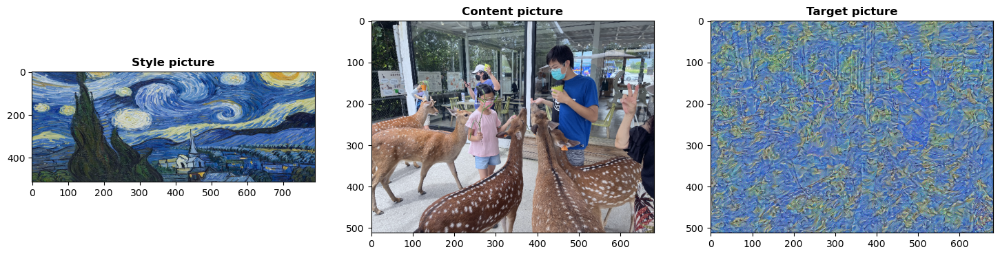

Iteration 2500 is completed. style_loss: 0.00 | content_loss: 5.40 | total_loss: 6.24


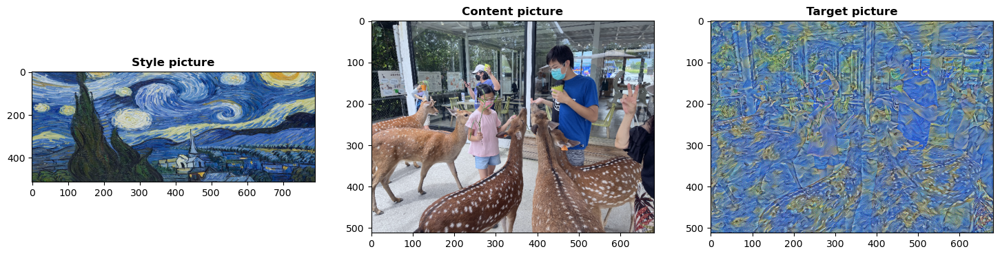

Iteration 3000 is completed. style_loss: 0.00 | content_loss: 4.11 | total_loss: 4.69


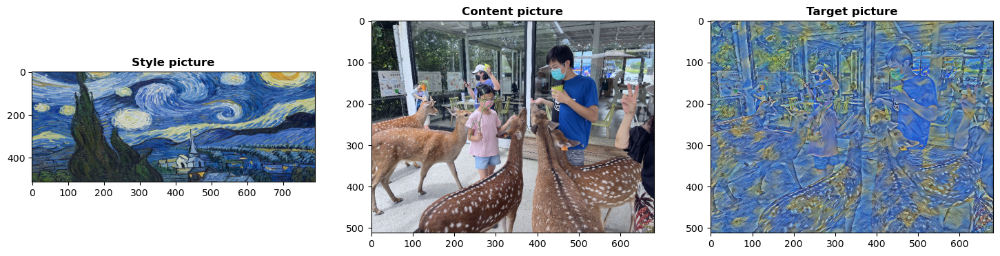

Iteration 3500 is completed. style_loss: 0.00 | content_loss: 3.41 | total_loss: 3.88


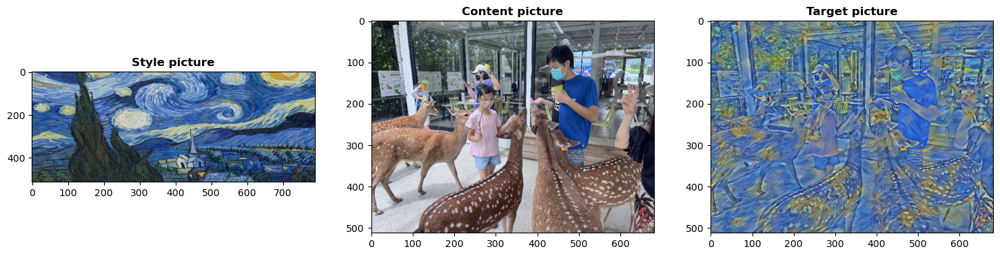

Iteration 4000 is completed. style_loss: 0.00 | content_loss: 3.05 | total_loss: 3.46


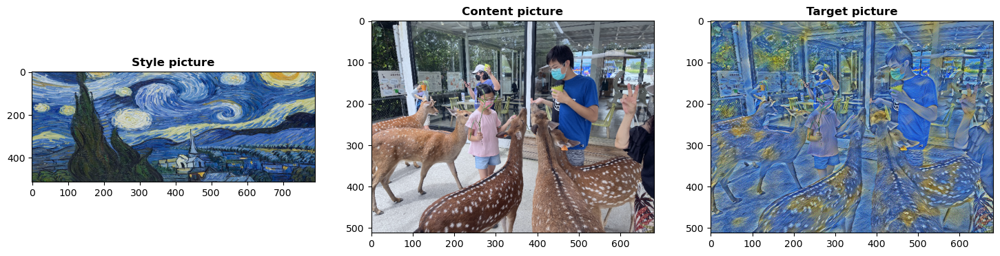

Iteration 4500 is completed. style_loss: 0.00 | content_loss: 2.84 | total_loss: 3.23


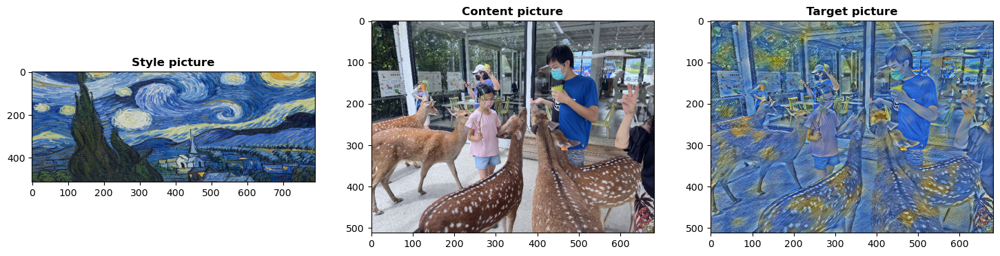

Iteration 5000 is completed. style_loss: 0.00 | content_loss: 2.73 | total_loss: 3.10


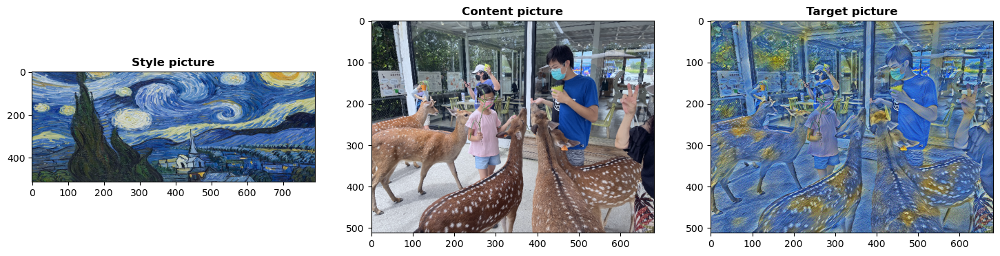

In [14]:
target = img_target.clone()
target.requires_grad = True
target = target.to(device)
style_scaling = 1e6

EPOCHS = 5_000

optimizer = torch.optim.RMSprop([target], lr=.001)

for i in range(EPOCHS):
    target_feature_maps, target_feature_names = get_feature(target, vgg)
    style_loss = 0
    content_loss = 0

    for j in range(len(target_feature_names)):

        if target_feature_names[j] in layers_content:
            content_loss += torch.mean((target_feature_maps[j] - content_feature_maps[j])**2)
        
        if target_feature_names[j] in layers_style:
            gram_target = gram(target_feature_maps[j])
            gram_style = gram(style_feature_maps[j])
            style_loss += torch.mean((gram_target - gram_style)**2) * weights_style[layers_style.index(target_feature_names[j])]
        
    total_loss = style_scaling * style_loss + content_loss

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if (i+1) % 500 == 0:
        print(f"Iteration {str(i+1).zfill(4)} is completed. style_loss: {style_loss:.2f} | content_loss: {content_loss:.2f} | total_loss: {total_loss:.2f}")
        display_results()
